## Import Packages

In [1]:
#importing some useful packages
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import cv2
import glob
%matplotlib inline

## Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.

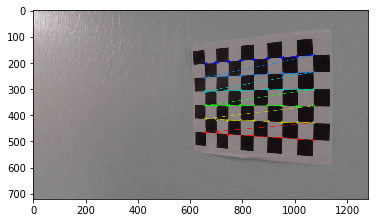

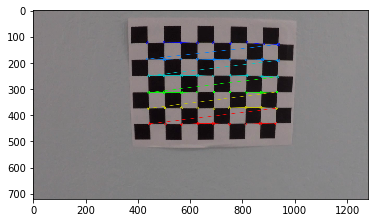

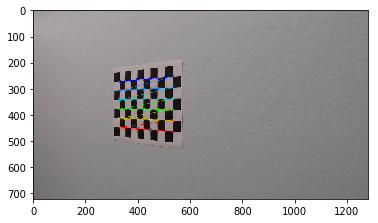

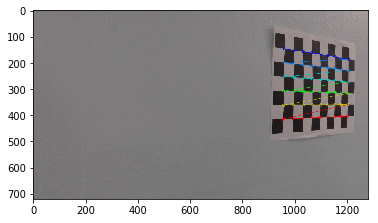

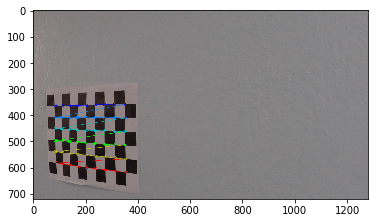

...

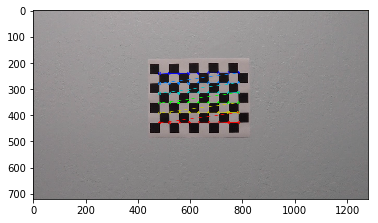

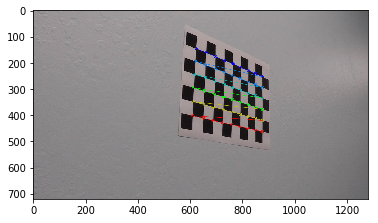

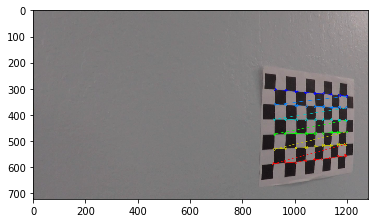

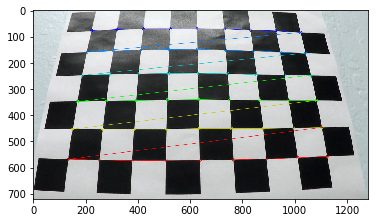

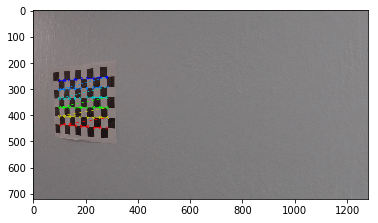

In [3]:
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)
objpoints = []
imgpoints = []
images = glob.glob('./camera_cal/calibration*.jpg')

for fname in images:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    ret, corners = cv2.findChessboardCorners(gray, (9,6), None)
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)
        cal_img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
        plt.imshow(cal_img)
        plt.show()  

ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)

## Ideas for Lane Detection Pipeline

Below are some helper functions.

In [8]:
import math

def undistort(img,mtx, dist, channel= 'BGR', show=False):
    '''The input img is BGR image. The output dst is RGB image.'''
    if channel == 'RGB':
        img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
    h, w = img.shape[:2]
    dst = cv2.undistort(img, mtx, dist, None, mtx)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    dst = cv2.cvtColor(dst, cv2.COLOR_BGR2RGB)
    if show:
        plt.figure(figsize=(20,30))
        plt.subplot(121) 
        plt.imshow(img)
        plt.title('before')
        plt.subplot(122) 
        plt.imshow(dst)
        plt.title('after')
        plt.show()  
    return dst

def abs_sobel_thresh(img, thresh_min=0, thresh_max=255, s_thresh_min=0, s_thresh_max=255, show=False):
    '''the input img is RGB img'''
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Sobel x
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh_min) & (s_channel <= s_thresh_max)] = 1
    combined_binary = np.zeros_like(sxbinary)
    combined_binary[(s_binary == 1) | (sxbinary == 1)] = 1
    if show:
        plt.figure(figsize=(20,30))
        plt.subplot(121) 
        plt.imshow(img)
        plt.title('before')
        plt.subplot(122) 
        plt.imshow(combined_binary,cmap='gray')
        plt.title('after')
        plt.show()  
    return combined_binary

def corners_unwarp(img, src, dst, offset=100, color=[255, 0, 0], thickness=2, show=False):
    raw_img = np.copy(img)
    img_size = (img.shape[1], img.shape[0])
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    warped = cv2.warpPerspective(raw_img, M, img_size, flags=cv2.INTER_LINEAR)
    if show:
        cv2.line(img, tuple(src[0]), tuple(src[1]), color, thickness)
        cv2.line(img, tuple(src[1]), tuple(src[2]), color, thickness)
        cv2.line(img, tuple(src[2]), tuple(src[3]), color, thickness)
        cv2.line(img, tuple(src[3]), tuple(src[0]), color, thickness)        
        cv2.line(warped, tuple(dst[0]), tuple(dst[1]), color, thickness)
        cv2.line(warped, tuple(dst[1]), tuple(dst[2]), color, thickness)
        cv2.line(warped, tuple(dst[2]), tuple(dst[3]), color, thickness)
        cv2.line(warped, tuple(dst[3]), tuple(dst[0]), color, thickness)
        plt.figure(figsize=(20,30))
        plt.subplot(121) 
        plt.imshow(img)
        plt.subplot(122) 
        plt.imshow(warped)
        plt.show()  
    return warped, M, Minv

def wrap(img, M, dst, color=[255, 0, 0], thickness=2, show=False):
    warped = cv2.warpPerspective(img, M, (img.shape[1], img.shape[0]))
    warped_copy = np.copy(warped)
    if show:
        cv2.line(warped_copy, tuple(dst[0]), tuple(dst[1]), color, thickness)
        cv2.line(warped_copy, tuple(dst[1]), tuple(dst[2]), color, thickness)
        cv2.line(warped_copy, tuple(dst[2]), tuple(dst[3]), color, thickness)
        cv2.line(warped_copy, tuple(dst[3]), tuple(dst[0]), color, thickness)
        plt.figure(figsize=(20,30))
        plt.subplot(121) 
        plt.imshow(img,cmap='gray')
        plt.title('before')
        plt.subplot(122) 
        plt.imshow(warped_copy,cmap='gray')
        plt.title('after')
        plt.show() 
    return warped


def search_lines1(binary_warped, show=False):
    # Assuming you have created a warped binary image called "binary_warped"
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),
        (0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),
        (0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    if show:
        plt.imshow(out_img)
        plt.plot(left_fitx, ploty, color='yellow')
        plt.plot(right_fitx, ploty, color='yellow')
        plt.xlim(0, 1280)
        plt.ylim(720, 0)
        plt.show()
    return left_fitx,right_fitx, ploty


    
def draw_lines(warped,left_fitx,right_fitx, ploty, Minv,undist, show=False):
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))
    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (warped.shape[1], warped.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(undist, 1, newwarp, 0.3, 0)
    if show:
        plt.imshow(result)
        plt.show()
    return result    


## Build a Lane Finding Pipeline

In [9]:
def draw_lane_lines(img,M,dst,Minv, channel= 'BGR', show=False):
    undistorted_img = undistort(img,mtx, dist,channel,show)
    thresh_min=20
    thresh_max=100
    s_thresh_min=170
    s_thresh_max=255
    warped = wrap(undistorted_img, M, dst, [255, 0, 0], 3,show)
    thresh_img = abs_sobel_thresh(warped, thresh_min, thresh_max, s_thresh_min, s_thresh_max,show)
    left_fitx,right_fitx, ploty = search_lines1(thresh_img,show)
    result = draw_lines(thresh_img,left_fitx,right_fitx, ploty, Minv,undistorted_img,show)
    return result

## Pick four points in a trapezoidal shape (similar to region masking) that would represent a rectangle when looking down on the road from above. 

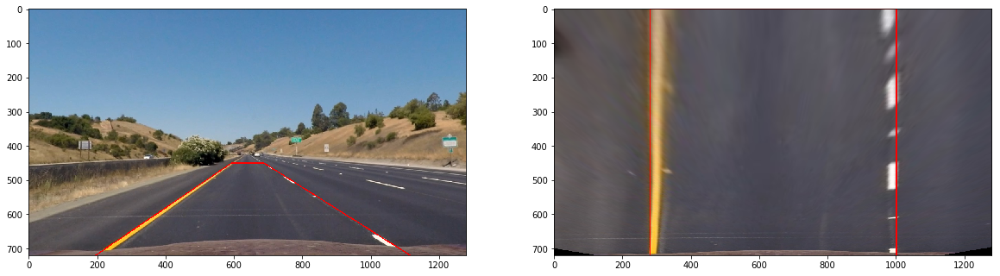

In [12]:
offset=280
test_images = glob.glob('./test_images/straight_lines*.jpg')
img = cv2.imread(test_images[0])
img = undistort(img,mtx, dist)
img_size = (img.shape[1], img.shape[0])
src = np.float32([[195,img_size[1]],[593,450],[687,450],[1115,img_size[1]]])
dst = np.float32([[offset, img_size[1]], [offset, 0], 
                         [img_size[0]-offset, 0], 
                         [img_size[0]-offset, img_size[1]]])
warped, M, Minv = corners_unwarp(img, src,dst, offset=100, color=[255, 0, 0], thickness=2,show=True)

## Test Images



./test_images/test3.jpg


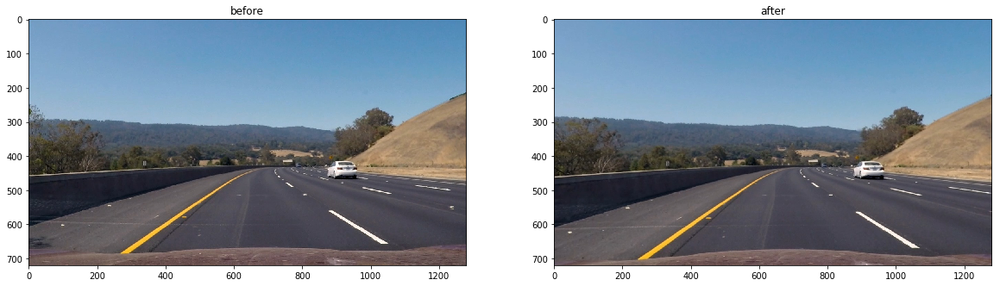

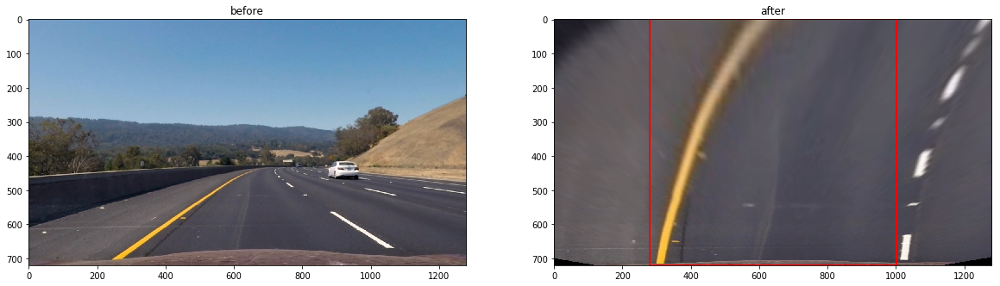

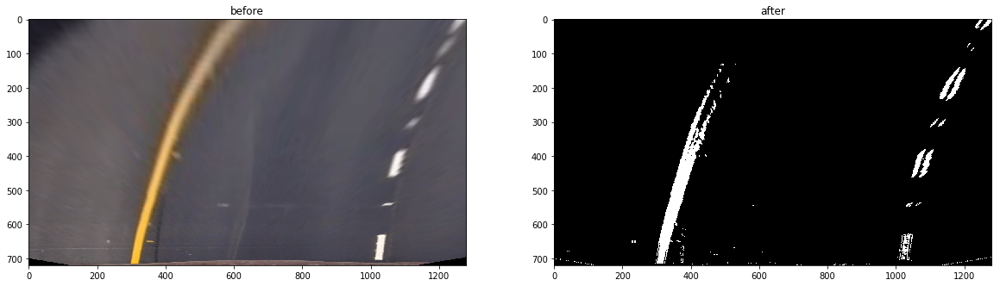

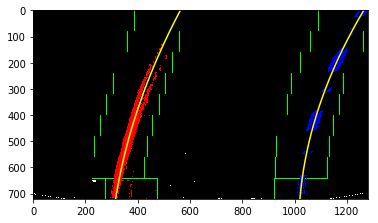

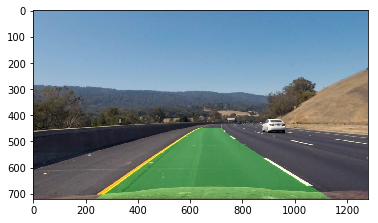

./test_images/straight_lines1.jpg


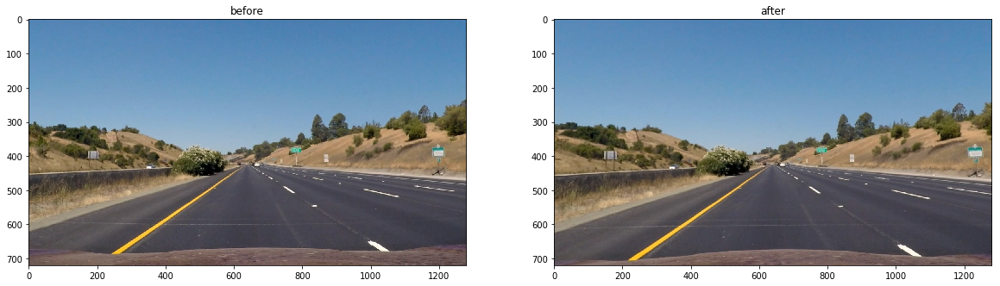

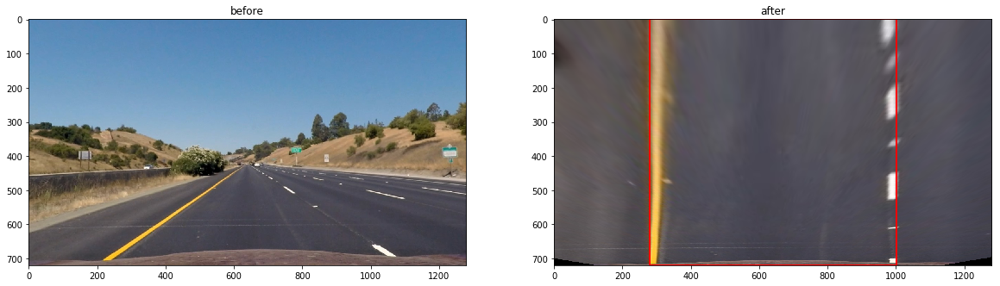

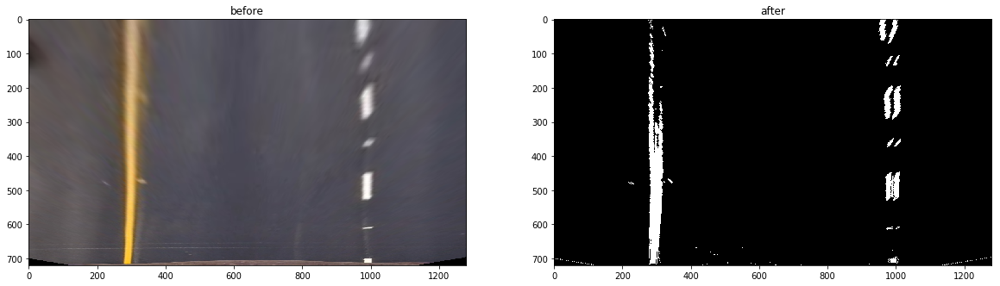

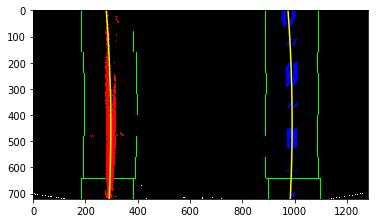

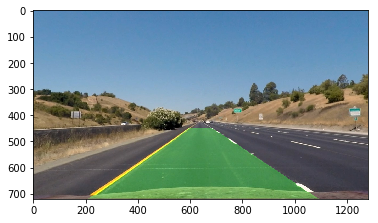

./test_images/test1.jpg


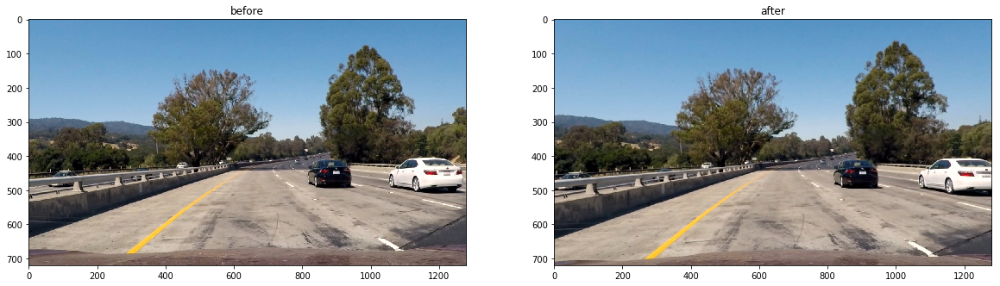

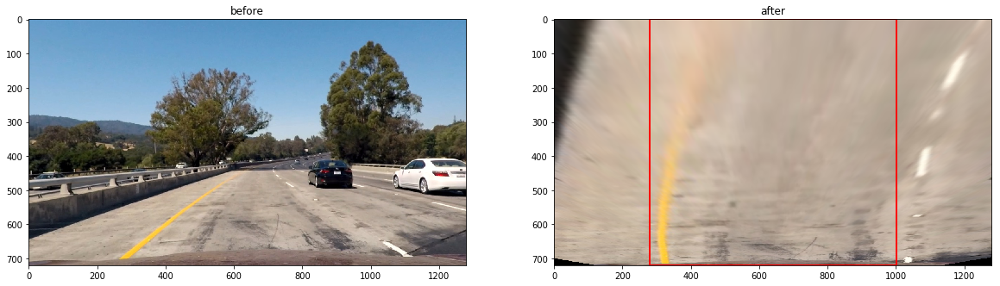

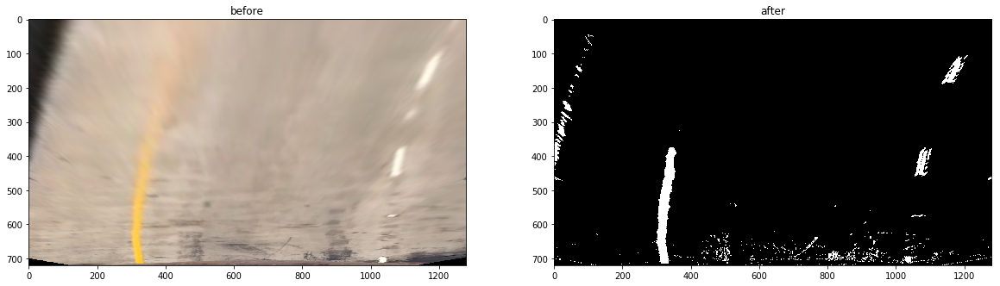

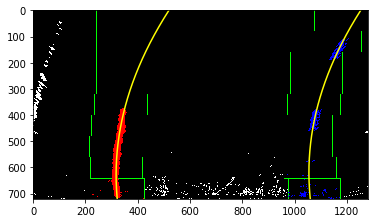

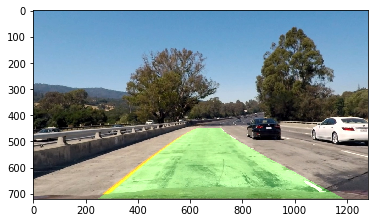

./test_images/test2.jpg


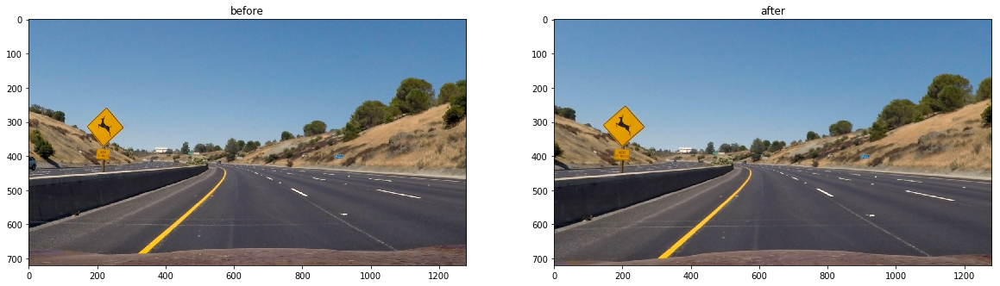

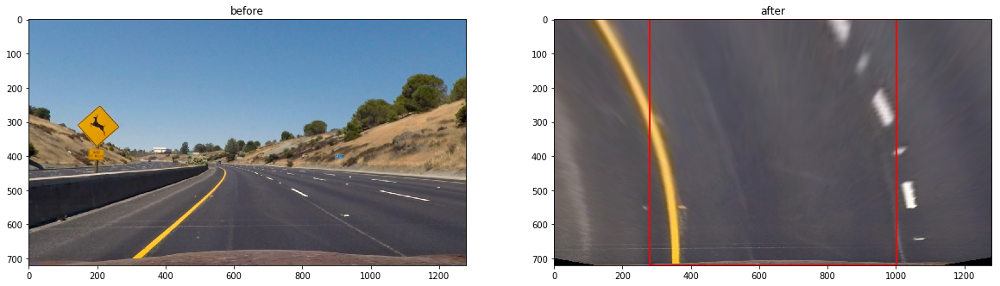

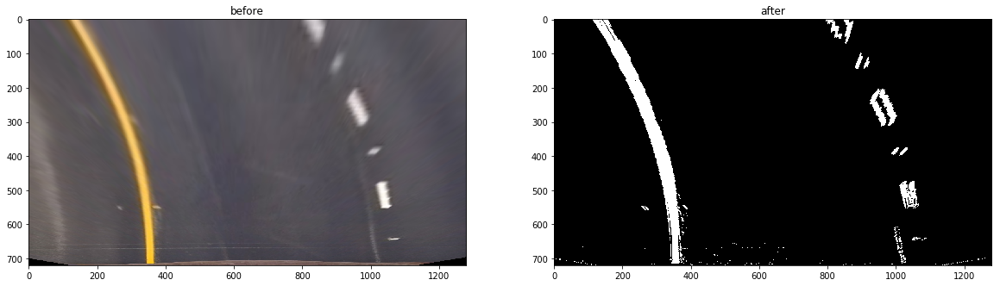

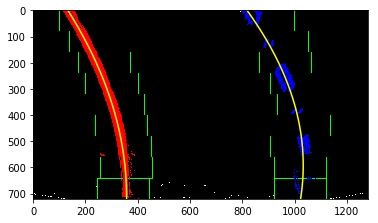

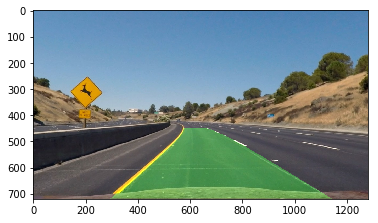

./test_images/test5.jpg


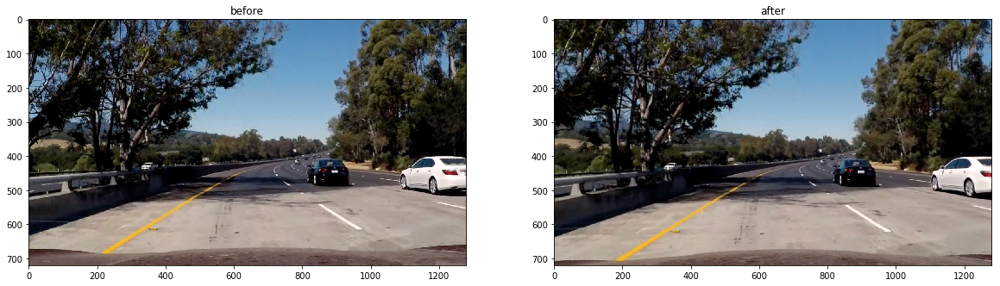

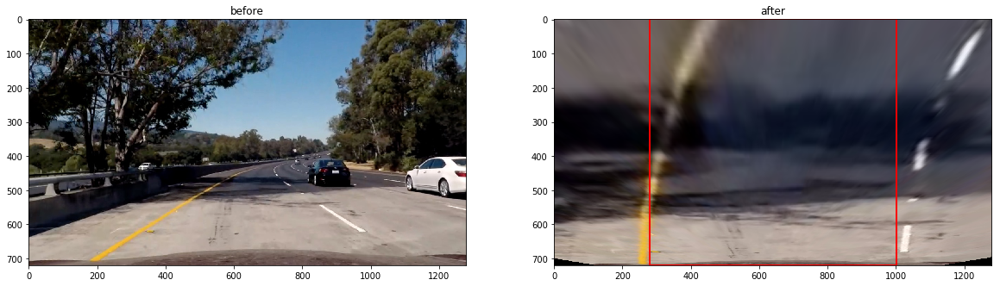

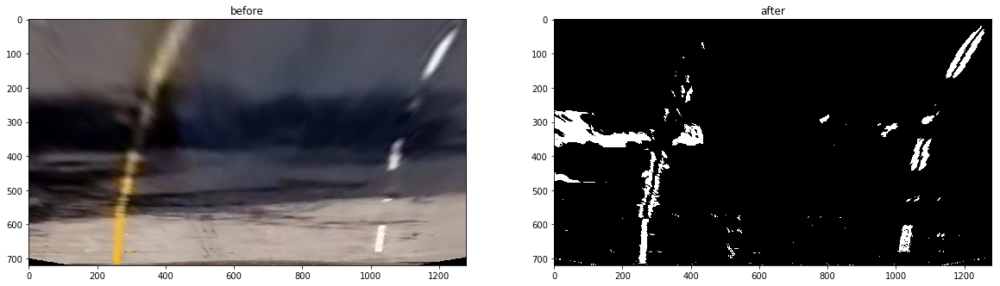

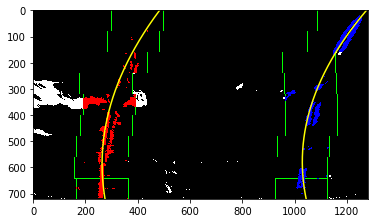

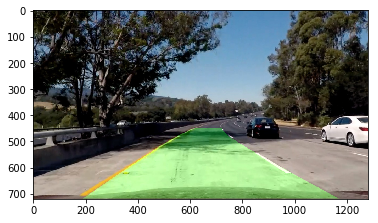

./test_images/test6.jpg


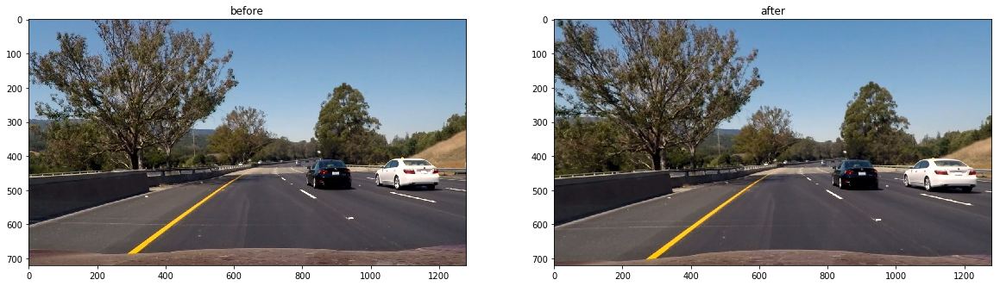

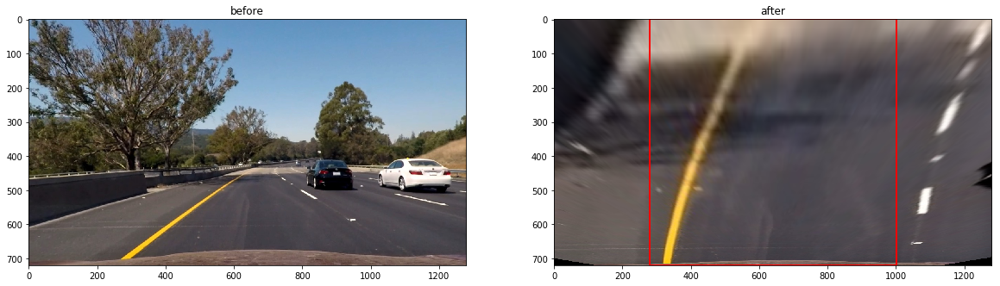

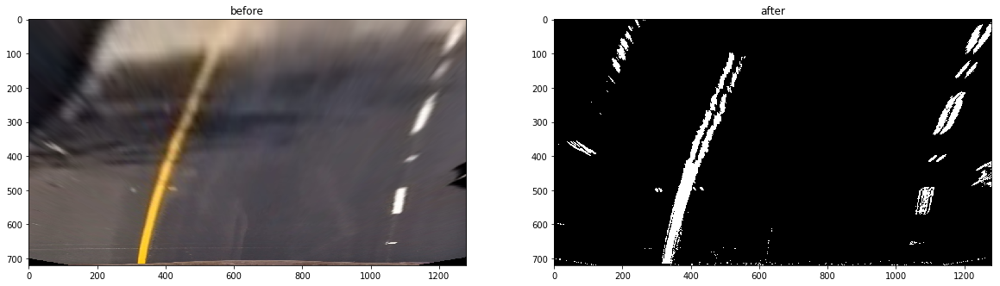

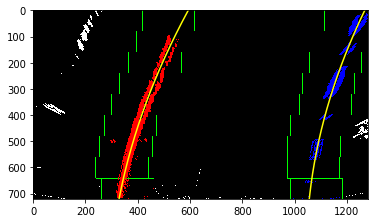

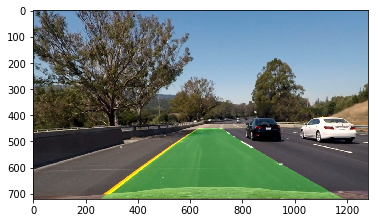

./test_images/test4.jpg


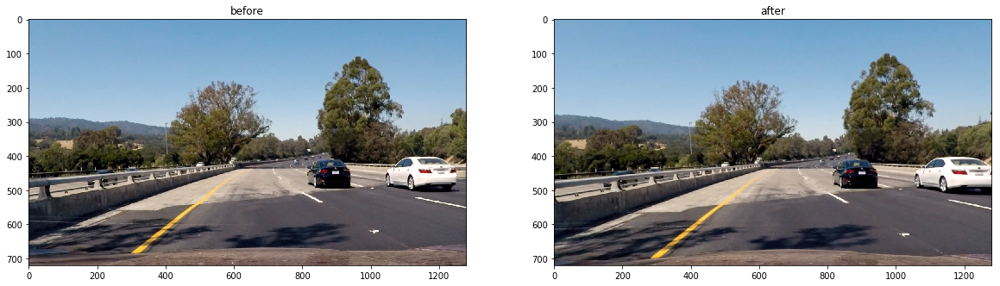

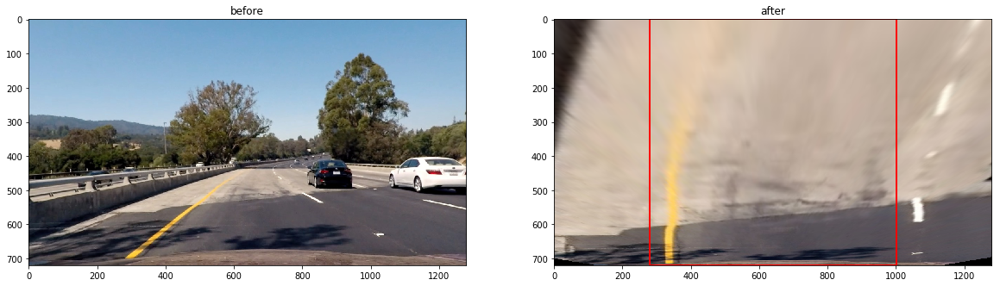

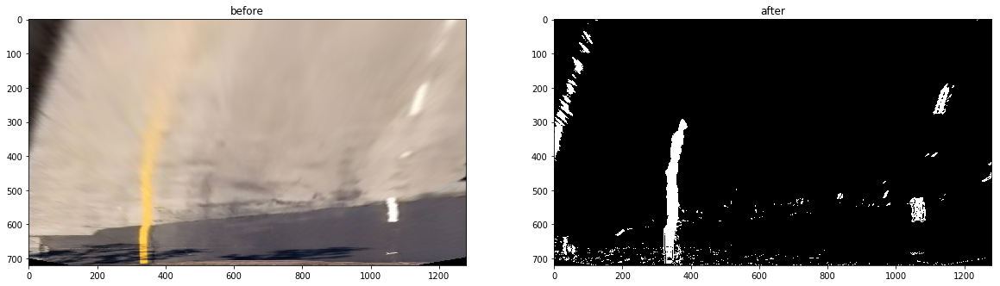

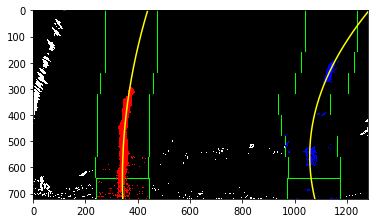

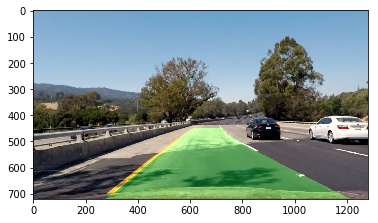

./test_images/straight_lines2.jpg


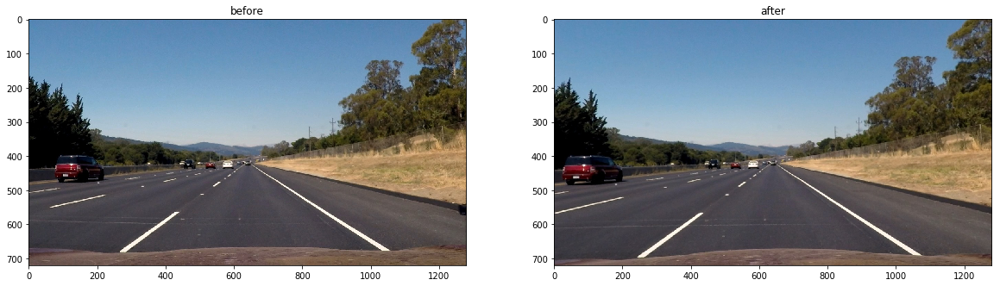

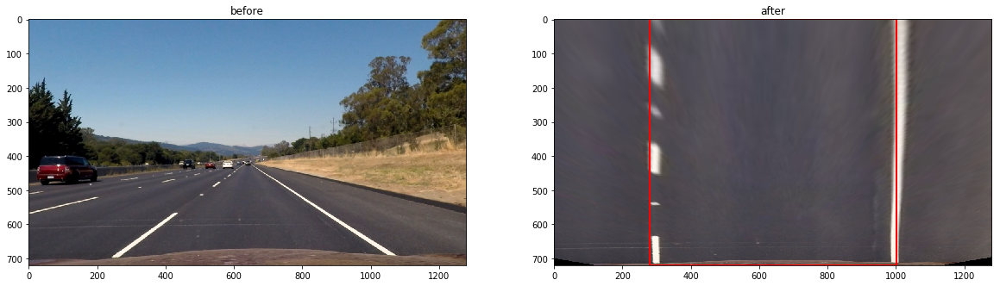

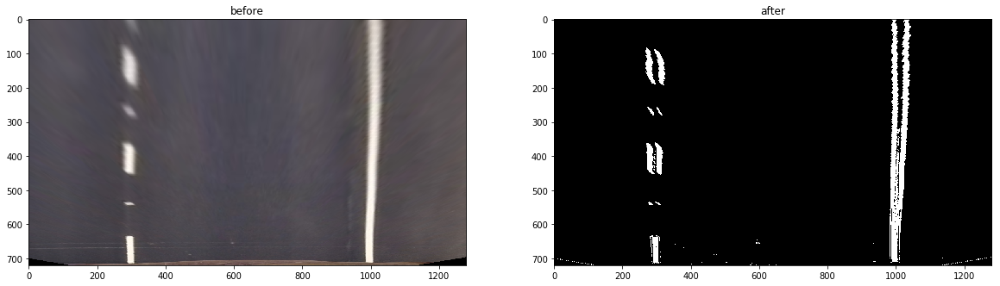

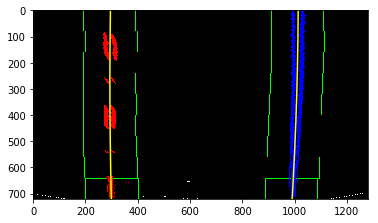

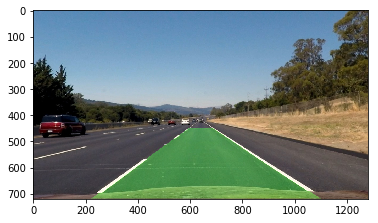

In [14]:

test_images = glob.glob('./test_images/*.jpg')
for fname in test_images:
    print(fname)
    img = cv2.imread(fname)
    result_image = draw_lane_lines(img,M,dst,Minv, channel= 'BGR', show=True)
#     plt.imshow(result_image,cmap='gray')
#     plt.show()

## Test on Videos

In [24]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [23]:
def process_image(image):
    result = draw_lane_lines(image,M,dst,Minv,'RGB')
    return result

In [25]:
white_output = 'test_videos_output/project_video_output.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
clip1 = VideoFileClip("project_video.mp4")
white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time white_clip.write_videofile(white_output, audio=False)

[MoviePy] >>>> Building video test_videos_output/project_video_output.mp4
[MoviePy] Writing video test_videos_output/project_video_output.mp4


100%|█████████▉| 1260/1261 [01:51<00:00, 11.19it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: test_videos_output/project_video_output.mp4 

CPU times: user 5min 8s, sys: 8.94 s, total: 5min 17s
Wall time: 1min 51s


Play the video inline.

In [26]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(white_output))